In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=dbda761408b23b24e136348a43ee81982068fcfdf4ca496932f585bf93e5a6cf
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report,
                           f1_score, roc_curve, auc, roc_auc_score)
import shap
import lime
import lime.lime_tabular
from sklearn.impute import SimpleImputer

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Set style for plots
plt.style.use('seaborn-v0_8')
sns.set_palette("Set2")

In [ ]:
# 1. Load and explore the dataset
print("Loading and exploring the dataset...")
df = pd.read_csv('bank.csv')
df.head(df.shape)

Loading and exploring the dataset...


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [ ]:
df.shape

(11162, 17)

In [ ]:
print("\nDataset info:")
df.info()


Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [ ]:
print("\nMissing values:")
df.isnull().sum()


Missing values:


,0
age,0
job,0
marital,0
education,0
default,0
balance,0
housing,0
loan,0
contact,0
day,0


In [ ]:
print("\nSummary statistics:")
df.describe()


Summary statistics:


,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


In [ ]:
print("\nTarget variable distribution:")
df['deposit'].value_counts()
df['deposit'].value_counts(normalize=True)


Target variable distribution:


,proportion
deposit,
no,0.52616
yes,0.47384


In [ ]:
# 2. Data preprocessing and encoding
print("\nPreprocessing data...")

# Create a copy for preprocessing
df_processed = df.copy()


Preprocessing data...


In [ ]:
# Handle categorical variables
categorical_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan',
                   'contact', 'month', 'poutcome']

In [ ]:
# Label encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col].astype(str))
    label_encoders[col] = le

In [ ]:
# Encode target variable
df_processed['deposit'] = df_processed['deposit'].map({'yes': 1, 'no': 0})

In [ ]:
# Handle numerical variables - replace negative values with 0 for balance
df_processed['balance'] = df_processed['balance'].apply(lambda x: max(0, x))

In [ ]:
# Check for any remaining missing values and handle them
imputer = SimpleImputer(strategy='median')
numeric_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
df_processed[numeric_cols] = imputer.fit_transform(df_processed[numeric_cols])

In [ ]:
# 3. Prepare features and target
X = df_processed.drop('deposit', axis=1)
y = df_processed['deposit']

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
                                                    random_state=42, stratify=y)

In [ ]:
# Scale numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Convert back to DataFrame for better feature naming
feature_names = X.columns.tolist()
X_train_scaled = pd.DataFrame(X_train_scaled, columns=feature_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=feature_names)

In [ ]:
# Logistic Regression
lr_model = LogisticRegression(random_state=42, max_iter=1000)
lr_model.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# Random Forest
rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# 5. Evaluate models
print("\nEvaluating models...")


Evaluating models...


In [ ]:
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    print(f"\n{model_name} Performance:")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
    print(f"ROC-AUC: {roc_auc_score(y_test, y_pred_proba):.4f}")

    # Confusion Matrix
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    # ROC Curve
    plt.subplot(1, 2, 2)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} - ROC Curve')
    plt.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

    # Classification report
    print(f"\nClassification Report for {model_name}:")
    print(classification_report(y_test, y_pred))

    return y_pred_proba


Logistic Regression Performance:
Accuracy: 0.8011
F1-Score: 0.7854
ROC-AUC: 0.8743


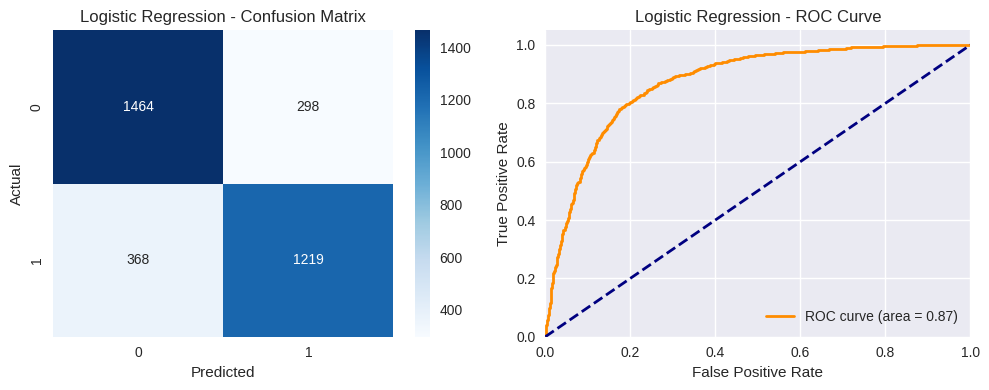


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.80      0.83      0.81      1762
           1       0.80      0.77      0.79      1587

    accuracy                           0.80      3349
   macro avg       0.80      0.80      0.80      3349
weighted avg       0.80      0.80      0.80      3349


Random Forest Performance:
Accuracy: 0.8462
F1-Score: 0.8413
ROC-AUC: 0.9167


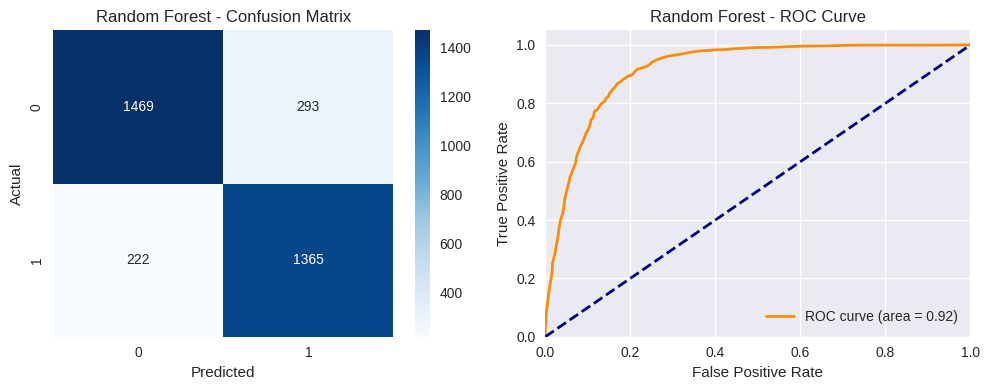


Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.87      0.83      0.85      1762
           1       0.82      0.86      0.84      1587

    accuracy                           0.85      3349
   macro avg       0.85      0.85      0.85      3349
weighted avg       0.85      0.85      0.85      3349



In [ ]:
# Evaluate both models
lr_proba = evaluate_model(lr_model, X_test_scaled, y_test, "Logistic Regression")
rf_proba = evaluate_model(rf_model, X_test_scaled, y_test, "Random Forest")

In [ ]:
# 6. Feature importance analysis
print("\nFeature Importance Analysis...")


Feature Importance Analysis...


Text(0.5, 0, 'Absolute Coefficient Value')

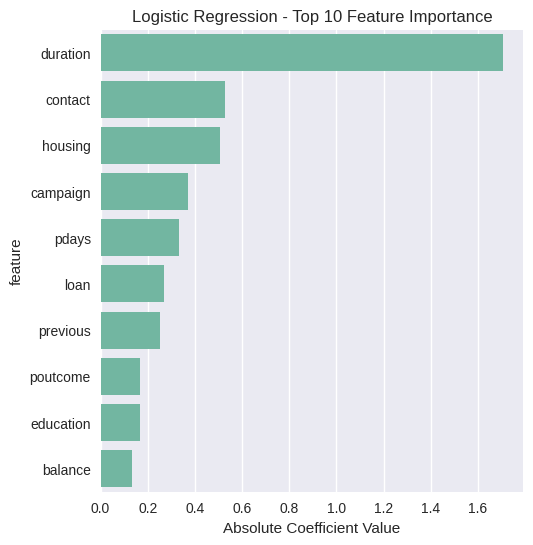

In [ ]:
# Logistic Regression coefficients
lr_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': np.abs(lr_model.coef_[0])
}).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.barplot(x='importance', y='feature', data=lr_importance.head(10))
plt.title('Logistic Regression - Top 10 Feature Importance')
plt.xlabel('Absolute Coefficient Value')

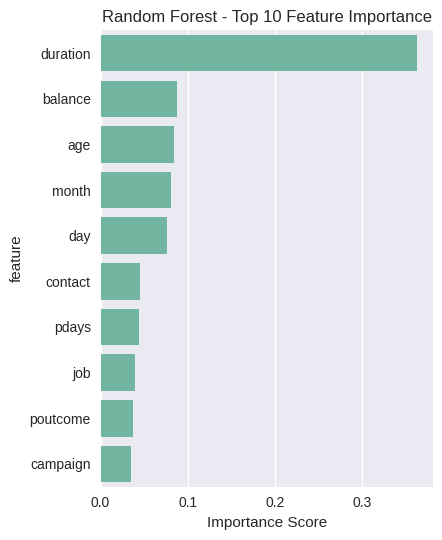

In [ ]:
# Random Forest feature importance
rf_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

plt.subplot(1, 2, 2)
sns.barplot(x='importance', y='feature', data=rf_importance.head(10))
plt.title('Random Forest - Top 10 Feature Importance')
plt.xlabel('Importance Score')

plt.tight_layout()
plt.show()

In [ ]:
# 7. SHAP explanations
print("\nGenerating SHAP explanations...")


Generating SHAP explanations...


In [ ]:
# Initialize SHAP explainer for Random Forest
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test_scaled)

<Figure size 2000x2000 with 0 Axes>

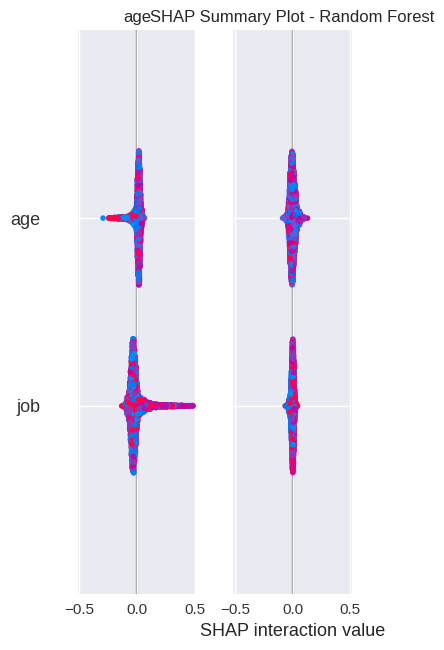

In [ ]:
# Summary plot
plt.figure(figsize=(20, 20))
shap.summary_plot(shap_values, X_test_scaled, feature_names=feature_names, show=False)
plt.title('SHAP Summary Plot - Random Forest')
plt.tight_layout()
plt.show()

In [ ]:
# 8. LIME explanations
print("\nGenerating LIME explanations...")

# Initialize LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled.values,
    feature_names=feature_names,
    class_names=['Not Subscribe', 'Subscribe'],
    mode='classification'
)


Generating LIME explanations...


In [ ]:
# Explain the same 5 samples with LIME
for i, idx in enumerate(sample_indices):
    print(f"\n--- LIME Explanation for Sample {i+1} (Index {idx}) ---")

    exp = explainer_lime.explain_instance(
        X_test_scaled.iloc[idx].values,
        rf_model.predict_proba,
        num_features=10
    )

    print(f"Actual: {'Subscribe' if y_test.iloc[idx] == 1 else 'Not Subscribe'}")
    print(f"Predicted probability: {rf_model.predict_proba(X_test_scaled.iloc[idx:idx+1])[0][1]:.3f}")

    # Show explanation in text
    exp.show_in_notebook(show_table=True, show_all=False)

    # Alternatively, print the explanation
    print("LIME explanation:")
    for feature, weight in exp.as_list():
        print(f"{feature}: {weight:.4f}")


--- LIME Explanation for Sample 1 (Index 2531) ---
Actual: Not Subscribe
Predicted probability: 0.060


LIME explanation:
-0.34 < duration <= 0.36: 0.0893
contact > 0.62: -0.0823
housing <= -0.95: 0.0479
loan <= -0.38: 0.0396
balance > 0.07: 0.0374
campaign <= -0.53: 0.0288
0.17 < month <= 0.80: -0.0264
education <= -0.38: -0.0242
pdays <= -0.48: 0.0149
default <= -0.12: -0.0096

--- LIME Explanation for Sample 2 (Index 3164) ---
Actual: Not Subscribe
Predicted probability: 0.000


LIME explanation:
duration <= -0.68: -0.3535
contact <= -0.60: 0.0595
-0.95 < housing <= 1.05: -0.0481
loan <= -0.38: 0.0370
campaign <= -0.53: 0.0196
0.17 < month <= 0.80: -0.0176
pdays <= -0.48: 0.0160
education <= -0.38: -0.0133
-0.48 < poutcome <= 0.52: 0.0128
-0.47 < balance <= -0.32: -0.0087

--- LIME Explanation for Sample 3 (Index 1198) ---
Actual: Not Subscribe
Predicted probability: 0.190


LIME explanation:
-0.34 < duration <= 0.36: 0.0925
contact <= -0.60: 0.0700
campaign > 0.18: -0.0588
loan <= -0.38: 0.0516
housing <= -0.95: 0.0485
pdays <= -0.48: 0.0327
default <= -0.12: 0.0314
-0.47 < balance <= -0.32: -0.0186
previous <= -0.36: -0.0142
education <= -0.38: -0.0133

--- LIME Explanation for Sample 4 (Index 1656) ---
Actual: Not Subscribe
Predicted probability: 0.160


LIME explanation:
contact <= -0.60: 0.0506
-0.95 < housing <= 1.05: -0.0428
loan <= -0.38: 0.0269
education <= -0.38: -0.0211
default <= -0.12: 0.0208
-0.53 < campaign <= -0.18: 0.0202
job > 0.78: -0.0181
-0.18 < age <= 0.67: -0.0166
-0.92 < day <= 0.03: 0.0120
-0.77 < month <= 0.17: -0.0088

--- LIME Explanation for Sample 5 (Index 409) ---
Actual: Subscribe
Predicted probability: 0.910


LIME explanation:
duration > 0.36: 0.2676
contact <= -0.60: 0.0542
housing <= -0.95: 0.0493
loan <= -0.38: 0.0411
campaign <= -0.53: 0.0259
education <= -0.38: -0.0244
-0.47 < balance <= -0.32: -0.0186
0.17 < month <= 0.80: -0.0167
pdays <= -0.48: 0.0151
-0.77 < age <= -0.18: -0.0092


In [ ]:
# 9. Final model comparison and selection
print("\nFinal Model Comparison:")
models = {
    'Logistic Regression': lr_model,
    'Random Forest': rf_model
}

results = []
for name, model in models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

    results.append({
        'Model': name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_pred_proba)
    })

results_df = pd.DataFrame(results)
print(results_df)


Final Model Comparison:
                 Model  Accuracy  F1-Score   ROC-AUC
0  Logistic Regression  0.801135  0.785438  0.874287
1        Random Forest  0.846223  0.841294  0.916663


In [ ]:
# Select best model based on F1-Score
best_model_name = results_df.loc[results_df['F1-Score'].idxmax(), 'Model']
best_model = models[best_model_name]
print(f"\nBest model: {best_model_name}")


Best model: Random Forest


In [ ]:
# 10. Save the best model and preprocessing objects
import joblib

# Create a dictionary with all necessary objects
model_artifacts = {
    'model': best_model,
    'scaler': scaler,
    'label_encoders': label_encoders,
    'feature_names': feature_names,
    'imputer': imputer
}

# Save artifacts
joblib.dump(model_artifacts, 'bank_term_deposit_model.pkl')
print("Model artifacts saved successfully!")

Model artifacts saved successfully!


In [ ]:
# 11. Create a prediction function for new data
def predict_term_deposit(new_data, model_artifacts):
    """
    Predict term deposit subscription for new data
    """
    # Preprocess new data
    processed_data = new_data.copy()

    # Label encode categorical variables
    for col, le in model_artifacts['label_encoders'].items():
        processed_data[col] = le.transform(processed_data[col].astype(str))

    # Handle balance negative values
    processed_data['balance'] = processed_data['balance'].apply(lambda x: max(0, x))

    # Impute missing values
    numeric_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
    processed_data[numeric_cols] = model_artifacts['imputer'].transform(processed_data[numeric_cols])

    # Scale features
    processed_data_scaled = model_artifacts['scaler'].transform(processed_data)
    processed_data_scaled = pd.DataFrame(processed_data_scaled, columns=model_artifacts['feature_names'])

    # Make prediction
    prediction = model_artifacts['model'].predict(processed_data_scaled)
    probability = model_artifacts['model'].predict_proba(processed_data_scaled)

    return prediction, probability

print("\nProject completed successfully!")


Project completed successfully!
